## **Smart Charging Network Planning: A Data-Driven Strategy for EV Development in Washington State**

Group - 3

Team Members: Fangzhou Zheng, Haojiang Wu, Yixi Yu, Pranaya Bindu Buyya

###**Introduction**

### **Problem Statement**
The increasing penetration of electric vehicles (EVs) presents significant challenges in charging infrastructure planning, geographic disparities in adoption, and policy effectiveness. Despite a 35% growth in EV sales (IEA, 2023), inadequate charging infrastructure remains a key barrier to widespread adoption (McKinsey, 2022). Moreover, most of studies do not consider EV distribution, location accessibility, and policy incentives together. Which leads to inefficient resource use and ineffective policies.

This study aims to analyze EV distribution, identify high-demand charging areas, and evaluate policy impact. The findings will:

* help policymakers assess the effectiveness of incentives like the Clean Alternative Fuel Vehicle (CAFV) program and make better infrastructure decisions.
* help energy providers optimize charging station locations to improve usage efficiency.
* help automakers understand regional demand patterns to refine marketing strategies.

By applying unsupervised machine learning methods, such as clustering and association rule mining, this study will uncover key trends in EV adoption. The results will offer data-driven insights to assist local government in optimizing EV deployment and infrastructure planning in Washington State to better serve local citizens.

### **Data Source**

**Source:** The dataset is made available for public release by the Washington Open Data Portal, providing up-to-date records of registered electric vehicles within the state.

**Dataset URL:** https://drive.google.com/file/d/1iLFacW1f3ENf4u6t4VgsW6GaeNn99za_/view?usp=drive_link   

**Data Dictionary:**

This dataset provides a comprehensive list of electric vehicles (EVs) registered in Washington State, including vehicle details, geographic location, and policy data. The data is taken from the Washington State Department of Licensing (DOL) and updated from time to time to reflect the latest EV registrations.

Dataset Size: approximately 51.7 MB

Number of Records: 22,392 rows (one for each EV registration)

Number of Attributes: 17 columns



| **Feature Name**               | **Description**                                           | **Data Type**                |
|--------------------------------|-----------------------------------------------------------|------------------------------|
| **VIN (1-10)**                 | First 10 digits of the Vehicle Identification Number      | Categorical                  |
| **County**                     | County where the EV is registered                        | Categorical                  |
| **City**                       | City of EV registration                                  | Categorical                  |
| **State**                      | State abbreviation                                       | Categorical                  |
| **Postal Code**                | ZIP code where the vehicle is registered                 | Categorical (Numeric)        |
| **Model Year**                 | Year the vehicle was manufactured                        | Numeric                      |
| **Make**                       | Vehicle manufacturer                                     | Categorical                  |
| **Model**                      | Specific model of the EV                                 | Categorical                  |
| **Electric Vehicle Type**       | EV classification (Battery or Hybrid)                   | Categorical                  |
| **CAFV Eligibility**           | Eligibility for Clean Alternative Fuel Vehicle incentives | Categorical                  |
| **Electric Range**             | Estimated driving range on a full charge (in miles)     | Numeric                      |
| **Base MSRP**                  | Manufacturer’s Suggested Retail Price                   | Numeric                      |
| **Legislative District**       | Washington legislative district                          | Categorical (Numeric)        |
|**DOL Vehicle ID**  |Unique number assigned to each vehicle by Department of Licensing for identification purposes| Numeric|
| **Vehicle Location**           | Geographic coordinates (latitude & longitude)           | Categorical (Converted to Numeric) |
| **Electric Utility**           | Power provider supplying electricity to the EV owner    | Categorical                  |
| **2020 Census Tract**         | Census demographic data reference                       | Categorical (Numeric)        |


## **Step 1: Data Cleaning & Preprocessing**

In [ ]:
#import data
import pandas as pd
import numpy as np

url = 'https://drive.google.com/uc?export=download&id=1iLFacW1f3ENf4u6t4VgsW6GaeNn99za_'
df = pd.read_csv(url)
df.head()

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
0,1C4JJXP66P,Kitsap,Poulsbo,WA,98370.0,2023,JEEP,WRANGLER,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,21.0,0.0,23.0,258127145,POINT (-122.64681 47.73689),PUGET SOUND ENERGY INC,5.303509e+10
1,1G1FX6S08K,Snohomish,Lake Stevens,WA,98258.0,2019,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238.0,0.0,44.0,4735426,POINT (-122.06402 48.01497),PUGET SOUND ENERGY INC,5.306105e+10
2,WBY1Z2C58F,King,Seattle,WA,98116.0,2015,BMW,I3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,81.0,0.0,34.0,272697666,POINT (-122.41067 47.57894),CITY OF SEATTLE - (WA)|CITY OF TACOMA - (WA),5.303301e+10
3,5YJ3E1EBXK,King,Seattle,WA,98178.0,2019,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,220.0,0.0,37.0,477309682,POINT (-122.23825 47.49461),CITY OF SEATTLE - (WA)|CITY OF TACOMA - (WA),5.303301e+10
4,5YJSA1V24F,Yakima,Selah,WA,98942.0,2015,TESLA,MODEL S,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,208.0,0.0,15.0,258112970,POINT (-120.53145 46.65405),PACIFICORP,5.307700e+10


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 223995 entries, 0 to 223994
Data columns (total 17 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   VIN (1-10)                                         223995 non-null  object 
 1   County                                             223992 non-null  object 
 2   City                                               223992 non-null  object 
 3   State                                              223995 non-null  object 
 4   Postal Code                                        223992 non-null  float64
 5   Model Year                                         223995 non-null  int64  
 6   Make                                               223995 non-null  object 
 7   Model                                              223995 non-null  object 
 8   Electric Vehicle Type                              223995 non-null  object

In [ ]:
df.isnull().sum()

,0
VIN (1-10),0
County,3
City,3
State,0
Postal Code,3
Model Year,0
Make,0
Model,0
Electric Vehicle Type,0
Clean Alternative Fuel Vehicle (CAFV) Eligibility,0


In [ ]:
df.dropna(inplace=True)

In [ ]:
df.isnull().count()

,0
VIN (1-10),223496
County,223496
City,223496
State,223496
Postal Code,223496
Model Year,223496
Make,223496
Model,223496
Electric Vehicle Type,223496
Clean Alternative Fuel Vehicle (CAFV) Eligibility,223496


In [ ]:
df[['Longitude', 'Latitude']] = df['Vehicle Location'].str.extract(r'POINT \((-?\d+\.\d+) (-?\d+\.\d+)\)')
df['Longitude'] = df['Longitude'].astype(float)
df['Latitude'] = df['Latitude'].astype(float)
df.drop(columns=['Vehicle Location'], inplace=True)

df

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Electric Utility,2020 Census Tract,Longitude,Latitude
0,1C4JJXP66P,Kitsap,Poulsbo,WA,98370.0,2023,JEEP,WRANGLER,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,21.0,0.0,23.0,258127145,PUGET SOUND ENERGY INC,5.303509e+10,-122.64681,47.73689
1,1G1FX6S08K,Snohomish,Lake Stevens,WA,98258.0,2019,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238.0,0.0,44.0,4735426,PUGET SOUND ENERGY INC,5.306105e+10,-122.06402,48.01497
2,WBY1Z2C58F,King,Seattle,WA,98116.0,2015,BMW,I3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,81.0,0.0,34.0,272697666,CITY OF SEATTLE - (WA)|CITY OF TACOMA - (WA),5.303301e+10,-122.41067,47.57894
3,5YJ3E1EBXK,King,Seattle,WA,98178.0,2019,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,220.0,0.0,37.0,477309682,CITY OF SEATTLE - (WA)|CITY OF TACOMA - (WA),5.303301e+10,-122.23825,47.49461
4,5YJSA1V24F,Yakima,Selah,WA,98942.0,2015,TESLA,MODEL S,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,208.0,0.0,15.0,258112970,PACIFICORP,5.307700e+10,-120.53145,46.65405
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
223990,7SAYGDEE4R,Pierce,Puyallup,WA,98374.0,2024,TESLA,MODEL Y,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0.0,0.0,2.0,264662359,PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),5.305307e+10,-122.27575,47.13959
223991,WBY8P2C00M,Snohomish,Lake Stevens,WA,98258.0,2021,BMW,I3,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0.0,0.0,44.0,157728168,PUGET SOUND ENERGY INC,5.306105e+10,-122.06402,48.01497
223992,JN1AZ0CP3B,Pierce,University Place,WA,98466.0,2011,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73.0,0.0,28.0,261733433,BONNEVILLE POWER ADMINISTRATION||CITY OF TACOM...,5.305307e+10,-122.53756,47.23165
223993,5YJ3E1EA2R,Pierce,Puyallup,WA,98374.0,2024,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0.0,0.0,25.0,275283487,PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),5.305307e+10,-122.27575,47.13959


In [ ]:
df.drop_duplicates(inplace=True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 223496 entries, 0 to 223994
Data columns (total 18 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   VIN (1-10)                                         223496 non-null  object 
 1   County                                             223496 non-null  object 
 2   City                                               223496 non-null  object 
 3   State                                              223496 non-null  object 
 4   Postal Code                                        223496 non-null  float64
 5   Model Year                                         223496 non-null  int64  
 6   Make                                               223496 non-null  object 
 7   Model                                              223496 non-null  object 
 8   Electric Vehicle Type                              223496 non-null  object 
 9 

In [ ]:
df[df.select_dtypes(include=['object']).columns] = df.select_dtypes(include=['object']).apply(lambda x: x.astype('category'))

##**Step 2: Exploratory Data Analysis: Looking into Interesting Insights**

For this project, we are performing Electric Vehicle (EV) adoption in Washington State based on a dataset available.

The primary goal of this EDA is to gain insights into EV distribution, model popularity, infrastructure availability, and policy impact. Through statistical analysis and visualizations, we aim to answer the following primary questions:

In [ ]:
df.describe()

,Postal Code,Model Year,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,2020 Census Tract,Longitude,Latitude
count,223496.000000,223496.000000,223496.000000,223496.000000,223496.000000,2.234960e+05,2.234960e+05,223496.000000,223496.000000
mean,98269.193739,2021.265266,47.726599,828.337957,28.876356,2.329479e+08,5.304006e+10,-122.063454,47.458093
std,310.659079,2.989873,84.975652,7366.061719,14.911001,6.884834e+07,1.644383e+07,1.054376,0.619611
min,98001.000000,1999.000000,0.000000,0.000000,1.000000,4.385000e+03,5.300195e+10,-124.627350,45.579230
25%,98052.000000,2020.000000,0.000000,0.000000,17.000000,2.008299e+08,5.303301e+10,-122.401990,47.328000
50%,98126.000000,2022.000000,0.000000,0.000000,32.000000,2.488410e+08,5.303303e+10,-122.291790,47.603260
75%,98375.000000,2023.000000,39.000000,0.000000,42.000000,2.674022e+08,5.305307e+10,-122.131580,47.722380
max,99403.000000,2025.000000,337.000000,845000.000000,49.000000,4.792548e+08,5.307794e+10,-117.043980,48.999760


### **a) What is the relative preference for Plug-in Hybrid Electric Vehicles (PHEVs) and Battery Electric Vehicles (BEVs)?**

Text(0.5, 0, 'Count')

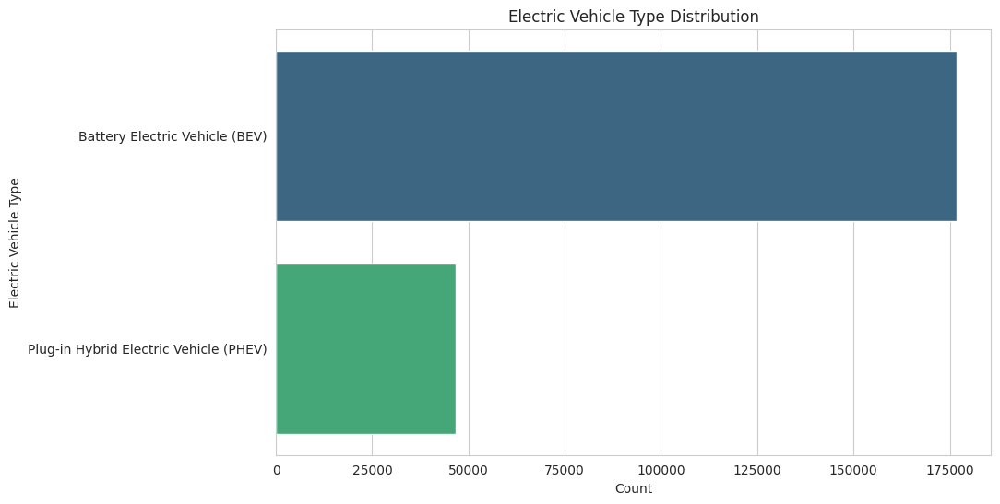

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.set_style("whitegrid")
sns.countplot(y='Electric Vehicle Type', data=df, palette='viridis', hue = 'Electric Vehicle Type')
plt.title('Electric Vehicle Type Distribution')
plt.xlabel('Count')

**Observations:**

Battery Electric Vehicles (BEVs) make up ~80% of the sample, and Plug-in Hybrid Electric Vehicles (PHEVs) make up a paltry ~20%. This indicates that there is high consumer demand for electric vehicles over hybrids, most likely due to improved charging infrastructure, longer battery lifespan, and government incentives favoring BEVs. While PHEVs have a niche market share, the trend is towards a continued move towards fully electric mobility as technology and infrastructure improve.

###**b) Which firms dominate the EV market?**

Text(0.5, 0, 'Count')

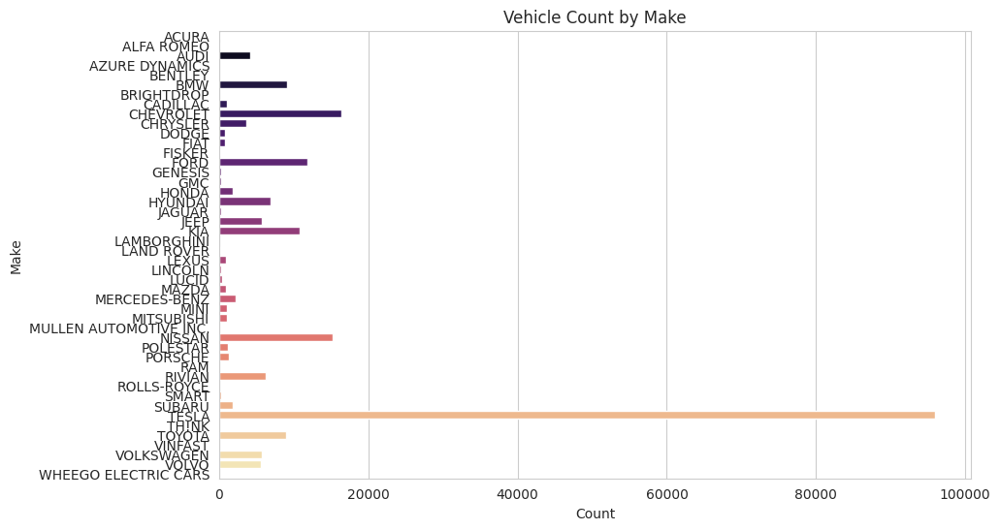

In [ ]:
plt.figure(figsize=(10, 6))
sns.set_style("whitegrid")
sns.countplot(y='Make', data=df, palette='magma', hue = 'Make')
plt.title('Vehicle Count by Make')
plt.xlabel('Count')

**Observations:**

Tesla is the EV leader by a significant margin over the next largest firms, with Chevrolet and Nissan following closely behind as significant players in the affordable EV space. Firms like Ford, Toyota, and Hyundai exist but have a relatively small share of the market. Tesla's leadership might be a result of extensive charging stations, superior brand awareness, and superior battery technology, whereas Chevrolet and Nissan exist as evidence of sustained demand for affordable EVs.


###**c) How has the adoption of EV evolved over the years?**

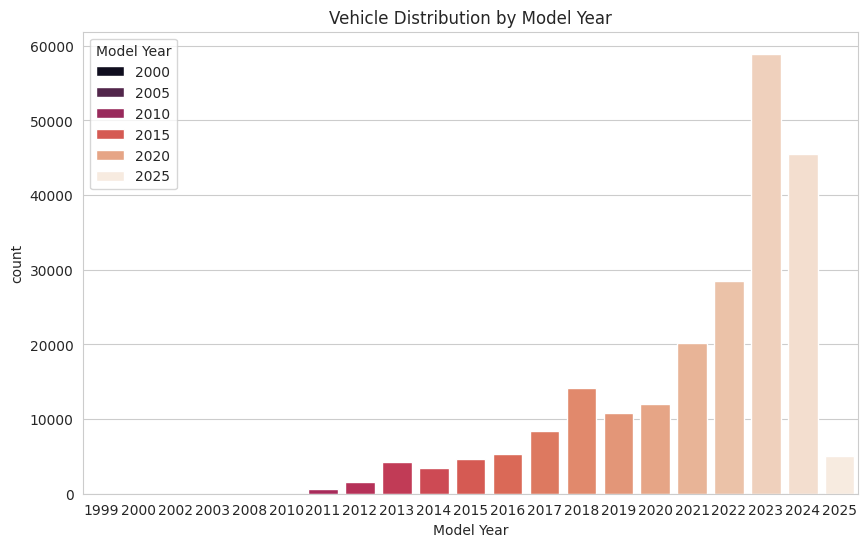

In [ ]:
plt.figure(figsize=(10, 6))
sns.set_style("whitegrid")
sns.countplot(x='Model Year', data=df, palette='rocket', hue = 'Model Year')
plt.title('Vehicle Distribution by Model Year')
plt.show()

**Observations:**

The majority of the registered EVs are made after 2018, with 2022 and 2023 representing the peak. EVs made before 2010 are rare, indicating that early uptake was unpopular and started picking up pace only in the last decade. The sharp spike in registrations over recent years is a reflection of the increase in battery technology, decreased affordability, and heightened policy support that have been fueling the relatively faster growth of the EV market.

###**d) Where is EV adoption geographically concentrated?**

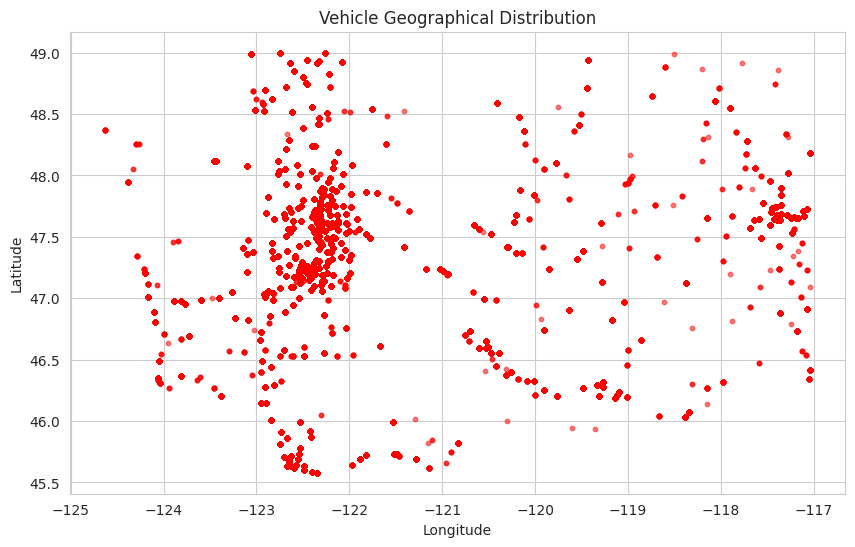

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(df["Longitude"], df["Latitude"], alpha=0.5, c='red', s=10)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Vehicle Geographical Distribution")
plt.grid(True)
plt.show()

**Observations:**

EV adoption is most dense in urban centers, with Seattle, Bellevue, and Tacoma. Rural regions, particularly eastern Washington, are low in adoption, likely due to infrequent charging infrastructure and reduced EV incentives. The most dense EV adoption tracks along the I-5 corridor correspond to population density and infrastructure availability, and the outlying regions are underserved.

###**e) How EV Adoption Varies by County**

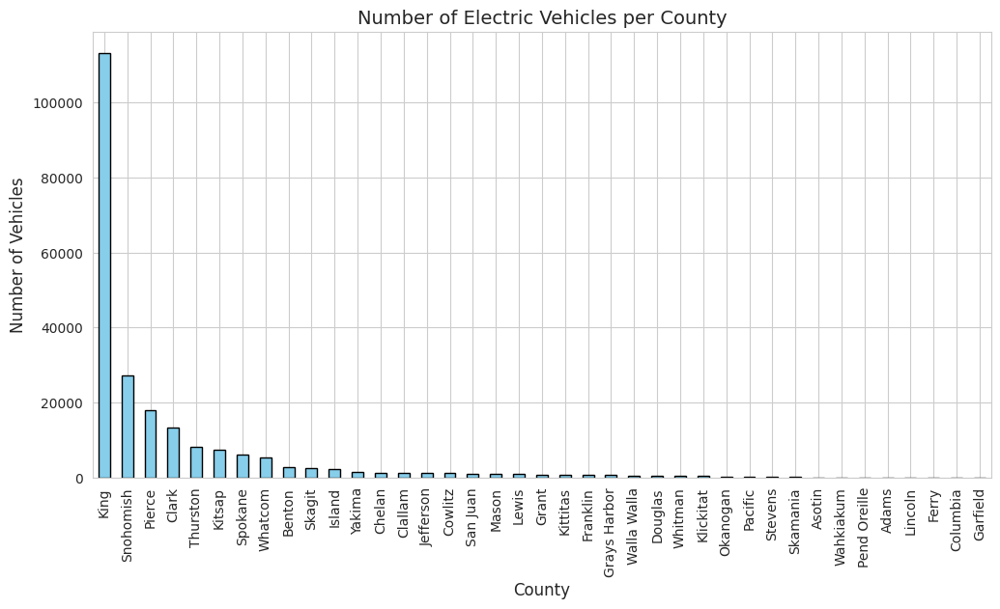

In [ ]:
county_vehicle_counts = df['County'].value_counts()

plt.figure(figsize=(12, 6))
county_vehicle_counts.plot(kind='bar', color='skyblue', edgecolor='black')

plt.title('Number of Electric Vehicles per County', fontsize=14)
plt.xlabel('County', fontsize=12)
plt.ylabel('Number of Vehicles', fontsize=12)
plt.xticks(rotation=90)

plt.show()

**Observations:**

King County has the most electric vehicles by a huge margin, followed by Snohomish and Pierce. Most counties have a much smaller EV presence, which suggests that EV adoption is highly concentrated in a few key areas. It is possibly due to factors like charging infrastructure availability, population density, or government incentives.

###**f) How do government incentives like CAFV eligibility impact adoption?**

<ipython-input-150-f8b18fc486b8>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cafv_counts.index, y=cafv_counts.values, palette="coolwarm", order=cafv_counts.index)


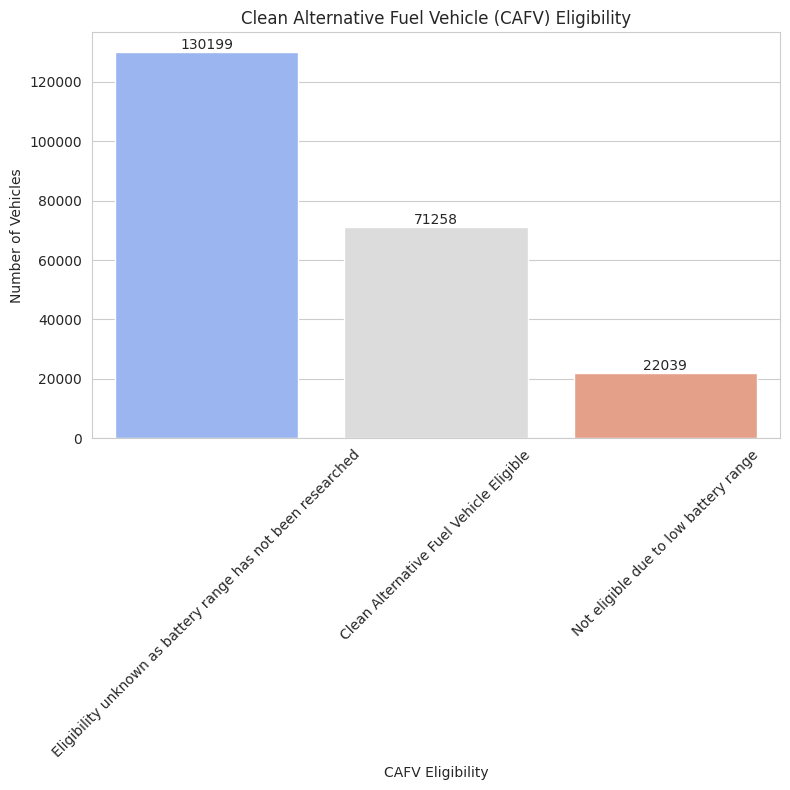

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

cafv_counts = df['Clean Alternative Fuel Vehicle (CAFV) Eligibility'].value_counts()

plt.figure(figsize=(8, 8))
sns.set_style("whitegrid")

sns.barplot(x=cafv_counts.index, y=cafv_counts.values, palette="coolwarm", order=cafv_counts.index)

plt.title('Clean Alternative Fuel Vehicle (CAFV) Eligibility')
plt.xlabel('CAFV Eligibility')
plt.ylabel('Number of Vehicles')

for i, count in enumerate(cafv_counts.values):
    plt.text(i, count + 0.1, str(count), ha='center', va='bottom')

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

**Observations:**

Most EVs (130,199) are CAFV-eligible, with 71,258 excluded. This suggests government incentives as a significant factor in EV adoption since most vehicles qualify for state programs offering cash incentives. The high proportion of CAFV-eligible cars indicates the success of policy-driven adoption efforts, though the proportion excluded warns of possible limits in accessibility of incentives.

## **Step 5: Optimizing EV Charging Infrastructure: Location, Demand, and Accessibility**

###**K-Means Clustering**

We applied K-Means clustering to analyze geography-oriented patterns in EV adoption near Washington State. By segmenting geographical areas into high, medium, and low EV adoption regions. This segmentation helps strategically locate charging hardware, identify necessary policy actions, and project near-future demand for EVs.



To analyze EV adoption patterns, we applied latitude and longitude coordinates to map registration points, and normalized numerical features for cluster balance. By Elbow Method, three was determined to be the optimal number of clusters, which implies high, medium, and low EV adoption regions in Washington State. The K-Means algorithm was then applied, dividing these regions and forming cluster centroids, which are representative of optimal charging station locations based on demand.

In [ ]:
car_locations = df[['Longitude', 'Latitude']]
car_locations.Latitude.value_counts()

,count
Latitude,
47.67858,5511
47.83448,4209
47.67887,3679
47.55584,3476
47.43473,3320
...,...
45.93967,1
47.22875,1
47.26438,1


In [ ]:
from sklearn.cluster import KMeans

charging_stations = []
county_cluster_counts = {}

for county, county_data in df.groupby("County"):
    car_locations = county_data[['Latitude', 'Longitude']].dropna().values

    if len(car_locations) < 2:
        continue

    n_clusters = max(2, min(5, len(car_locations) // 2))

    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    kmeans.fit(car_locations)

    county_cluster_counts[county] = n_clusters


    county_charging_stations = kmeans.cluster_centers_
    for station in county_charging_stations:
        charging_stations.append([county, station[0], station[1]])


charging_stations_df = pd.DataFrame(charging_stations, columns=["County", "Latitude", "Longitude"])
for county, n_clusters in county_cluster_counts.items():
    print(f"County: {county}, Number of Clusters: {n_clusters}")


<ipython-input-165-be0eed0bb1e1>:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for county, county_data in df.groupby("County"):
/usr/local/lib/python3.11/dist-packages/sklearn/base.py:1389: ConvergenceWarning: Number of distinct clusters (4) found smaller than n_clusters (5). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/usr/local/lib/python3.11/dist-packages/sklearn/base.py:1389: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (5). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/usr/local/lib/python3.11/dist-packages/sklearn/base.py:1389: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (5). Possibly due to duplicate points in X.
  return fit_meth

County: Adams, Number of Clusters: 5
County: Asotin, Number of Clusters: 5
County: Benton, Number of Clusters: 5
County: Chelan, Number of Clusters: 5
County: Clallam, Number of Clusters: 5
County: Clark, Number of Clusters: 5
County: Columbia, Number of Clusters: 5
County: Cowlitz, Number of Clusters: 5
County: Douglas, Number of Clusters: 5
County: Ferry, Number of Clusters: 5
County: Franklin, Number of Clusters: 5
County: Garfield, Number of Clusters: 2
County: Grant, Number of Clusters: 5
County: Grays Harbor, Number of Clusters: 5
County: Island, Number of Clusters: 5
County: Jefferson, Number of Clusters: 5
County: King, Number of Clusters: 5
County: Kitsap, Number of Clusters: 5
County: Kittitas, Number of Clusters: 5
County: Klickitat, Number of Clusters: 5
County: Lewis, Number of Clusters: 5
County: Lincoln, Number of Clusters: 5
County: Mason, Number of Clusters: 5
County: Okanogan, Number of Clusters: 5
County: Pacific, Number of Clusters: 5
County: Pend Oreille, Number of

In [ ]:
pip install folium geopandas branca

In [ ]:
import folium
from folium.plugins import HeatMap
from IPython.display import display


m = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=8)

heat_data = list(zip(df['Latitude'], df['Longitude']))
HeatMap(heat_data).add_to(m)

for _, row in charging_stations_df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        icon=folium.Icon(color="red", icon="bolt", prefix="fa"),
        popup=f"Charging Station in {row['County']}"
    ).add_to(m)

display(m)

**Observations:**

The heatmap shows the divide of Washington State into high, medium, and low EV adoption regions, with valuable insights on charging infrastructure planning and policy strategies.

High-adoption hubs like Seattle, Bellevue, and Tacoma are identified, where existing charging networks must be scaled up to meet growing demand.

Suburbs like Spokane, Everett, and Olympia have moderate EV penetration and are the strongest candidates for policy intervention and infrastructure investment to accelerate adoption.

Rural parts of Eastern Washington remain under-served with charging infrastructure deficiencies being a major barrier.

**Charging pile optimization base on Electric Vehicles Proportion**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

county_vehicle_counts = df['County'].value_counts()
total_vehicles = county_vehicle_counts.sum()
county_ratios = county_vehicle_counts / total_vehicles

In [ ]:
total_charging_stations = 300

county_stations = (county_ratios * total_charging_stations).round().astype(int)
county_stations[county_stations < 2] = 2

while county_stations.sum() != total_charging_stations:
    diff = total_charging_stations - county_stations.sum()
    idx = np.argmax(county_ratios)
    county_stations.iloc[idx] += diff

In [ ]:
charging_stations = []
county_cluster_counts2 = {}

for county, county_data in df.groupby("County"):
    car_locations = county_data[['Latitude', 'Longitude']].dropna().values

    n_clusters = min(county_stations[county], len(car_locations))
    county_cluster_counts2[county] = n_clusters

    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    kmeans.fit(car_locations)

    county_charging_stations = kmeans.cluster_centers_
    for station in county_charging_stations:
        charging_stations.append([county, station[0], station[1]])

charging_stations_df2 = pd.DataFrame(charging_stations, columns=["County", "Latitude", "Longitude"])
county_cluster_counts_df2 = pd.DataFrame(county_cluster_counts2.items(), columns=['County', 'Number of Clusters'])

<ipython-input-170-6c7fd9f32476>:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for county, county_data in df.groupby("County"):
/usr/local/lib/python3.11/dist-packages/sklearn/base.py:1389: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (2). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/usr/local/lib/python3.11/dist-packages/sklearn/base.py:1389: ConvergenceWarning: Number of distinct clusters (1) found smaller than n_clusters (2). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/usr/local/lib/python3.11/dist-packages/sklearn/base.py:1389: ConvergenceWarning: Number of distinct clusters (89) found smaller than n_clusters (120). Possibly due to duplicate points in X.
  return fit_m

In [ ]:
county_cluster_counts_df2

,County,Number of Clusters
0,Adams,2
1,Asotin,2
2,Benton,4
3,Chelan,2
4,Clallam,2
5,Clark,18
6,Columbia,2
7,Cowlitz,2
8,Douglas,2
9,Ferry,2


In [ ]:
m = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=8)

heat_data = list(zip(df['Latitude'], df['Longitude']))
HeatMap(heat_data).add_to(m)

for _, row in charging_stations_df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        icon=folium.Icon(color="red", icon="bolt", prefix="fa"),
        popup=f"Charging Station in {row['County']}"
    ).add_to(m)

m

**Observations:**

The analysis allocates 300 charging stations across Washington counties in proportion to EV density fractions using K-Means clustering and proportional allocation techniques.

The distribution method optimizes charging station locations in more EV registrated counties and ensures that every county has at least one charging station for low-density region uptake.

Clustering outputs provide geospatial centroids of the optimal charging station locations, ensuring effective coverage and accessibility.

The heatmap visualization also reveals EV hotspots, reinforcing the case for additional charging infrastructure in suburban and rural counties.

These findings guide data-driven deployment of charging stations, enabling balanced growth in infrastructure and enhancing accessibility for EV users across the state.

### **DBSCAN Clustering**

In [ ]:
from sklearn.cluster import DBSCAN
import numpy as np
import pandas as pd

charging_stations = []

for county, county_data in df.groupby("County"):
    car_locations = county_data[['Latitude', 'Longitude']].values

    dbscan = DBSCAN(eps=0.01, min_samples=5)
    dbscan.fit(car_locations)

    labels = dbscan.labels_
    unique_clusters = set(labels) - {-1}

    print(f"DBSCAN detected {len(unique_clusters)} clusters for {county}")

    for cluster in unique_clusters:
        cluster_points = car_locations[np.where(labels == cluster)]
        cluster_center = np.mean(cluster_points, axis=0)
        charging_stations.append([county, cluster, cluster_center[0], cluster_center[1]])

charging_stations_df_db = pd.DataFrame(charging_stations, columns=["County", "Cluster", "Latitude", "Longitude"])

<ipython-input-173-2288307fa57a>:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for county, county_data in df.groupby("County"):


DBSCAN detected 2 clusters for Adams
DBSCAN detected 2 clusters for Asotin
DBSCAN detected 8 clusters for Benton
DBSCAN detected 8 clusters for Chelan
DBSCAN detected 6 clusters for Clallam
DBSCAN detected 20 clusters for Clark
DBSCAN detected 1 clusters for Columbia
DBSCAN detected 8 clusters for Cowlitz
DBSCAN detected 6 clusters for Douglas
DBSCAN detected 3 clusters for Ferry
DBSCAN detected 5 clusters for Franklin
DBSCAN detected 0 clusters for Garfield
DBSCAN detected 9 clusters for Grant
DBSCAN detected 14 clusters for Grays Harbor
DBSCAN detected 7 clusters for Island
DBSCAN detected 8 clusters for Jefferson
DBSCAN detected 79 clusters for King
DBSCAN detected 17 clusters for Kitsap
DBSCAN detected 8 clusters for Kittitas
DBSCAN detected 6 clusters for Klickitat
DBSCAN detected 19 clusters for Lewis
DBSCAN detected 4 clusters for Lincoln
DBSCAN detected 9 clusters for Mason
DBSCAN detected 11 clusters for Okanogan
DBSCAN detected 8 clusters for Pacific
DBSCAN detected 3 cluster

In [ ]:
print(charging_stations_df_db.head())

   County  Cluster  Latitude  Longitude
0   Adams        0  47.12740 -118.37977
1   Adams        1  46.82616 -119.17420
2  Asotin        0  46.41402 -117.04556
3  Asotin        1  46.34056 -117.04784
4  Benton        0  46.31484 -119.26844


In [ ]:
cluster_counts = charging_stations_df_db.groupby("County").size()
print(cluster_counts.sort_values(ascending=False))

County
King            79
Pierce          54
Spokane         33
Snohomish       27
Clark           20
Lewis           19
Kitsap          17
Yakima          17
Whatcom         16
Grays Harbor    14
Thurston        12
Okanogan        11
Stevens          9
Mason            9
Skagit           9
Grant            9
Cowlitz          8
Kittitas         8
Jefferson        8
Benton           8
Chelan           8
Pacific          8
San Juan         7
Island           7
Skamania         6
Douglas          6
Clallam          6
Klickitat        6
Walla Walla      5
Franklin         5
Whitman          5
Lincoln          4
Pend Oreille     3
Ferry            3
Wahkiakum        3
Asotin           2
Adams            2
Columbia         1
dtype: int64


In [ ]:
m = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=8)

heat_data = list(zip(df['Latitude'], df['Longitude']))
HeatMap(heat_data).add_to(m)

for _, row in charging_stations_df_db.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        icon=folium.Icon(color="red", icon="bolt", prefix="fa"),
        popup=f"Charging Station in {row['County']}"
    ).add_to(m)

m

**Observations**

The map illustrates that there are clear patterns of EV uptake across Washington State, highlighting urban hotspots, suburban growth possibilities, and rural access difficulties.

Seattle, Bellevue, and Tacoma emerge as high-density EV clusters, with high levels of demand for fast-charging points.

Spokane, Everett, and Olympia's moderate-density clusters indicate growing suburban EV uptake and, as such, are good locations to develop infrastructure.

In contrast, rural communities in Eastern Washington exhibitresult in scattered clusters, indicating low but growing adoption constrained by restricted charging opportunities.